# Guided DDIM Reconstruction for Limited-Angle CT (LaDiff)

This notebook tests the trained **ladiff** diffusion model using the DDIM pipeline
with sinogram guidance. The diffusion prior (unconditional) is combined with a
gradient-descent data-consistency step at each denoising iteration, enforcing
agreement with the measured limited-angle projections.

**Pipeline overview:**
1. Load the limited-angle data for a chosen time-frame.
2. Reconstruct a *ground truth* from the **full** sinogram (FBP / GD).
3. Run DDIM with sinogram guidance using only the **limited-angle** projections.
4. Compare the guided reconstruction to the ground truth (PSNR, SSIM).

## 1. Imports and Setup

In [1]:
import sys, time
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch

# ── Project paths ─────────────────────────────────────────────────────────
project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))
sys.path.insert(0, '/myhome/astra-torch')
sys.path.insert(0, '/myhome/chip-project')

# ── Data loading ──────────────────────────────────────────────────────────
from inct.dataset_slices import ProjectionSliceDataset
from sdate.limited_angle_tomo import (
    LimitedAngleConfig, build_limited_angle_dataset, BaseLimitedAngleReconstructions
)

# ── Reconstruction (2D parallel beam via lamino with angle=0) ─────────────
from astra_torch.lamino import (
    fbp_reconstruction_masked,
    gd_reconstruction_masked,
)

# ── Diffusion model / pipeline ────────────────────────────────────────────
from chip.models.latent_unet2D import LatentUnet2D
from chip.schedulers.scheduling_ddim import GuidedDDIMScheduler
from chip.schedulers.pipeline_ddim import DDIMPipeline
from chip.models.tomographic_cbct_diffusion import GuidanceConfig

# ── Metrics ────────────────────────────────────────────────────────────────
from skimage.metrics import peak_signal_noise_ratio as compute_psnr
from skimage.metrics import structural_similarity as compute_ssim

# ── Laminography angle for standard 2D parallel-beam CT ───────────────────
LAMINO_ANGLE_DEG = 0.0

plt.rcParams['figure.figsize'] = (14, 5)
plt.rcParams['image.cmap'] = 'gray'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}  |  PyTorch {torch.__version__}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name()}")

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


✓ h5py available
⚠ SimpleITK not found. Install with: pip install SimpleITK
Device: cuda  |  PyTorch 2.8.0+cu128
GPU: NVIDIA A100 80GB PCIe


## 2. Configuration

Parameters must match the training command:
```
python train_ladiff.py --num_projections 1501 --target_height 640 --target_width 540 \
    --image_size 540 --n_slices 500 --k_angles 400 --epochs 30 --batch_size 3 \
    --data_path /myhome/data/sdate/shared/compression_paper/file_1_extracted
```

In [4]:
import json

# ── Data ──────────────────────────────────────────────────────────────────
DATA_PATH = Path('/myhome/data/sdate/shared/compression_paper/file_1_extracted')
NUM_PROJECTIONS = 1501
TARGET_SIZE = (640, 540)

# ── Limited-angle tomography ──────────────────────────────────────────────
N_SLICES = 500
K_ANGLES = 400

# ── CT geometry ───────────────────────────────────────────────────────────
DET_SPACING_MM = 1.0
VOXEL_SIZE_MM = 1.0
IMAGE_SIZE = 640  # reconstruction is (IMAGE_SIZE, IMAGE_SIZE)

# ── Model ─────────────────────────────────────────────────────────────────
CHECKPOINT_PATH = str(project_root / 'checkpoints' / 'ddpm_ladiff.pt')

# ── Test frame ────────────────────────────────────────────────────────────
TEST_SLICE_IDX = 400  # which time-slice to test (0 .. N_SLICES-1)

# ── DDIM inference ────────────────────────────────────────────────────────
NUM_INFERENCE_STEPS = 50

# ── NUM_FRAMES number of frames to generate in each inference ────────────────────────────────────────────────────────
NUM_FRAMES = 5

# ── GAP Stride between consecutive frames to generate in each inference (e.g. GAP=20 means frames [0, 20, 40, ...]) ────────────────────────────────────────────────────────
GAP = 20


# ── Normalization ─────────────────────────────────────────────────────────
# Load norm_scale from the dataset's cached config or the checkpoint sidecar
NORM_SCALE = 1.0
for norm_path in [
    DATA_PATH / 'ladiff_norm_config.json',
    Path(CHECKPOINT_PATH.replace('.pt', '_norm.json')),
]:
    if norm_path.exists():
        with open(norm_path) as f:
            NORM_SCALE = float(json.load(f)['norm_scale'])
        print(f"  Loaded norm_scale = {NORM_SCALE:.4f} from {norm_path}")
        break
else:
    print("  ⚠ No normalization config found — using norm_scale=1.0")

normalize_fn = lambda x: x * NORM_SCALE
denormalize_fn = lambda x: x / NORM_SCALE

print("Configuration set ✅")
print(f"  Data:       {DATA_PATH}")
print(f"  Slices:     {N_SLICES}")
print(f"  Angles/sl:  {K_ANGLES}")
print(f"  Test slice: {TEST_SLICE_IDX}")
print(f"  Checkpoint: {CHECKPOINT_PATH}")
print(f"  Norm scale: {NORM_SCALE:.4f}")

  Loaded norm_scale = 342.1634 from /myhome/data/sdate/shared/compression_paper/file_1_extracted/ladiff_norm_config.json
Configuration set ✅
  Data:       /myhome/data/sdate/shared/compression_paper/file_1_extracted
  Slices:     500
  Angles/sl:  400
  Test slice: 400
  Checkpoint: /myhome/sdate/checkpoints/ddpm_ladiff.pt
  Norm scale: 342.1634


## 3. Load Data and Build Limited-Angle Dataset

In [5]:
la_recons_dataset = BaseLimitedAngleReconstructions(
    data_path=DATA_PATH,
    num_projections=NUM_PROJECTIONS,
    target_size=TARGET_SIZE,
    n_slices=N_SLICES,
    k_angles=K_ANGLES,
    angular_range_deg=(0.0, 180.0),
    det_spacing_mm=DET_SPACING_MM,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    num_frames=NUM_FRAMES,
    gap=GAP,
    height_skip=0,  # skip 0 pixels from top and bottom of the volume (to avoid artifacts near the edges
)


dataset = la_recons_dataset.get_projection_slice_dataset()

la_data = la_recons_dataset.la_data

volume = dataset.get_full_volume()  # (H, W, N_proj)
H_vol, W_vol, N_proj = volume.shape
print(f"Volume shape: ({H_vol}, {W_vol}, {N_proj})")

Install with: pip install pillow-heif
✅ Found parameters in JC_62d.log: {'num_darks': 10, 'num_flats': 100, 'num_projections': 1501}
📂 Loaded folder: file_1_extracted
   Total TIFF files: 1711
   Darks: 10, Flats: 100, Projections: 1501
   Image dimensions: 2560 x 2160
   Use attenuation: True
✅ Loaded cached attenuation data from .tomography_cache_atten.npz
   Range: [-0.1997, 1.7837]
ProjectionSliceDataset:
  Volume shape: (540, 640, 1501)
  Slice dimension: 2
  Slices per batch: 1
  Voxels per slice (dim=2): 345,600
Loading 1501 projections...
  Loaded 50/1501
  Loaded 100/1501
  Loaded 150/1501
  Loaded 200/1501
  Loaded 250/1501
  Loaded 300/1501
  Loaded 350/1501
  Loaded 400/1501
  Loaded 450/1501
  Loaded 500/1501
  Loaded 550/1501
  Loaded 600/1501
  Loaded 650/1501
  Loaded 700/1501
  Loaded 750/1501
  Loaded 800/1501
  Loaded 850/1501
  Loaded 900/1501
  Loaded 950/1501
  Loaded 1000/1501
  Loaded 1050/1501
  Loaded 1100/1501
  Loaded 1150/1501
  Loaded 1200/1501
  Loaded 12

/myhome/sdate/sdate/limited_angle_tomo.py:428: UserWarning: [BaseLimitedAngleReconstructions] Using cached normalization scale = 342.1634 (from /myhome/data/sdate/shared/compression_paper/file_1_extracted/ladiff_norm_config.json). Reconstructions will be multiplied by this factor to map them to ~[0, 1].
  self.norm_scale: float = self._calibrate_normalization(data_path)


In [6]:
print(la_data.angle_coverage_summary())

Limited-angle dataset: 500 slices, k=400 angles/slice, total=1501 projections
 Slice   Height   Angle start   Angle end   #Angles
-------------------------------------------------------
     0        0          0.00°       47.85°       400
     1        1         47.97°       95.82°       400
     2        2         95.94°      143.78°       400
     3        3        143.90°       11.75°       400
     4        4         11.87°       59.72°       400
     5        5         59.84°      107.69°       400
     6        6        107.81°      155.66°       400
     7        7        155.78°       23.62°       400
     8        8         23.74°       71.59°       400
     9        9         71.71°      119.56°       400
    10       10        119.68°      167.53°       400
    11       11        167.65°       35.50°       400
    12       12         35.62°       83.46°       400
    13       13         83.58°      131.43°       400
    14       14        131.55°      179.40°       400
    

## 4. Select Test Frame

Extract the full sinogram and limited-angle sinogram for the chosen time-slice.

In [7]:
TEST_SLICE_IDX = 4  # which time-slice to test (0 .. N_SLICES-1)
slice_idx = TEST_SLICE_IDX
assert 0 <= slice_idx < N_SLICES, f"slice_idx must be in [0, {N_SLICES})"

# Full sinogram for ground truth (all angles, shape: (V, W))
full_sino = la_data.full_sinograms[slice_idx]  # (total_projections, W)
all_angles = la_data.all_angles_deg             # (total_projections,)

# Limited-angle sinogram for guidance (shape: (k_angles, W))
limited_sino = la_data.limited_sinograms[slice_idx]    # (k_angles, W)
limited_angles = la_data.slice_angles_deg[slice_idx]   # (k_angles,)

W = la_data.W
vol_shape_2d = (1, W, W)  # (nz=1, ny, nx) for 2D parallel beam

print(f"Test slice {slice_idx}:")
print(f"  Full sinogram:    {full_sino.shape}  |  angles: {all_angles[0]:.1f}° – {all_angles[-1]:.1f}°")
print(f"  Limited sinogram: {limited_sino.shape}  |  angles: {limited_angles[0]:.1f}° – {limited_angles[-1]:.1f}°")
print(f"  Reconstruction volume: {vol_shape_2d}")

Test slice 4:
  Full sinogram:    torch.Size([1501, 640])  |  angles: 0.0° – 179.9°
  Limited sinogram: torch.Size([400, 640])  |  angles: 11.9° – 59.7°
  Reconstruction volume: (1, 640, 640)


## 5. Ground Truth: Full-Angle Reconstruction

Reconstruct the ground truth from **all** projections using FBP.
This is only available for testing purposes.

Ground truth FBP: torch.Size([640, 640]) in 0.1s
  range: [-0.0013, 0.0045]
Limited-angle FBP: torch.Size([640, 640])
  range: [-0.0115, 0.0083]


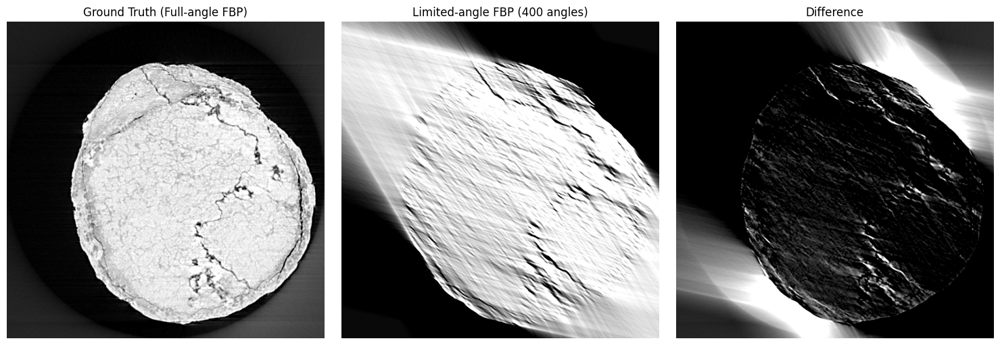

In [37]:
# FBP ground truth from the full sinogram
t0 = time.time()
gt_recon = fbp_reconstruction_masked(
    projs_vrc=full_sino.unsqueeze(1).to(device),  # (V, 1, W)
    angles_deg=all_angles,
    lamino_angle_deg=LAMINO_ANGLE_DEG,
    vol_shape=vol_shape_2d,
    det_spacing_mm=DET_SPACING_MM,
    filter_type='hann',
    device=device,
)  # (1, ny, nx)
gt_recon = gt_recon.squeeze(0)  # (ny, nx)
print(f"Ground truth FBP: {gt_recon.shape} in {time.time()-t0:.1f}s")
print(f"  range: [{gt_recon.min():.4f}, {gt_recon.max():.4f}]")

# Also compute a limited-angle FBP (baseline)
la_fbp = fbp_reconstruction_masked(
    projs_vrc=limited_sino.unsqueeze(1).to(device),  # (k, 1, W)
    angles_deg=limited_angles,
    lamino_angle_deg=LAMINO_ANGLE_DEG,
    vol_shape=vol_shape_2d,
    det_spacing_mm=DET_SPACING_MM,
    filter_type='hann',
    device=device,
).squeeze(0)  # (ny, nx)
print(f"Limited-angle FBP: {la_fbp.shape}")
print(f"  range: [{la_fbp.min():.4f}, {la_fbp.max():.4f}]")

# Visualise
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, title in zip(axes, 
    [gt_recon.cpu(), la_fbp.cpu(), (gt_recon - la_fbp).cpu()],
    ['Ground Truth (Full-angle FBP)', f'Limited-angle FBP ({K_ANGLES} angles)', 'Difference']):
    vmin, vmax = np.percentile(gt_recon.cpu().numpy(), [2, 98])
    ax.imshow(img.numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.axis('off')
plt.tight_layout()
plt.show()

tensor[640, 640] n=409600 (1.6Mb) x∈[-0.001, 0.004] μ=0.001 σ=0.001 cuda:0

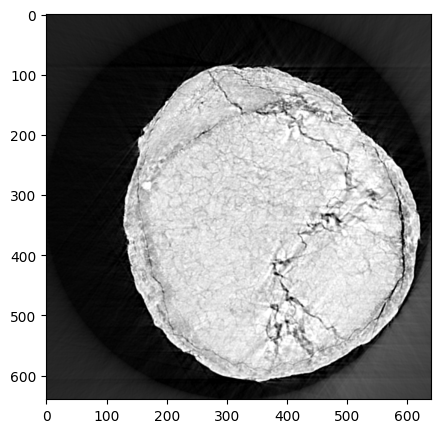

In [40]:
vmin, vmax = np.percentile(gt_recon.cpu().numpy(), [1, 99])
slice_idx = max(0, 200 + TEST_SLICE_IDX * K_ANGLES - 1501//2)
plt.imshow(denormalize_fn(la_recons_dataset[slice_idx].cpu().squeeze()), cmap='gray', vmin=vmin, vmax=vmax)
sw_fbp_recon = denormalize_fn(la_recons_dataset[slice_idx].cpu().squeeze()).cuda()
sw_fbp_recon

## 6. Load Trained Diffusion Model

In [42]:
# Build the same architecture used during training
channels = (64, 64, 128, 128, 256, 256)
model = LatentUnet2D(
    compression=1,
    input_channels=1,   # unconditional
    output_channels=1,
    sample_size=IMAGE_SIZE,
    layers_per_block=2,
    block_out_channels=channels,
    down_block_types=(
        "DownBlock2D", "DownBlock2D", "DownBlock2D",
        "DownBlock2D", "AttnDownBlock2D", "DownBlock2D",
    ),
    up_block_types=(
        "UpBlock2D", "AttnUpBlock2D", "UpBlock2D",
        "UpBlock2D", "UpBlock2D", "UpBlock2D",
    ),
).to(device)

# Load checkpoint
ckpt = torch.load(CHECKPOINT_PATH, map_location=device)
model.load_state_dict(ckpt['model_state_dict'])
model.eval()
print(f"Model loaded from {CHECKPOINT_PATH}")
print(f"  Parameters: {sum(p.numel() for p in model.parameters()):,}")

Model loaded from /myhome/sdate/checkpoints/ddpm_ladiff.pt
  Parameters: 28,444,929


## 7. Define Guidance Function (2D Parallel Beam)

The guidance function enforces data consistency at each DDIM step by running a
few gradient-descent iterations of `gd_reconstruction_masked` from
`astra_torch.lamino` (2D parallel beam geometry with `lamino_angle=0`).

In [43]:
def sinogram_guidance_2d(
    projs_vrc: torch.Tensor,     # (k_angles, 1, W) — limited-angle measurements
    angles_deg: np.ndarray,      # (k_angles,)
    vol_init: torch.Tensor,      # (1, H, W) — current denoised estimate
    max_epochs: int = 5,
    lr: float = 0.5,
    batch_size: int = 30,
    verbose: bool = False,
) -> torch.Tensor:
    """Run GD reconstruction guided by the limited-angle projections.

    Uses `gd_reconstruction_masked` from `astra_torch.lamino` with
    `lamino_angle_deg=0` for standard 2D parallel-beam geometry.

    Returns
    -------
    recon : (1, H, W) tensor
    """
    recon = gd_reconstruction_masked(
        projs_vrc=projs_vrc,
        angles_deg=angles_deg,
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        vol_shape=vol_init.shape,           # (1, H, W)
        det_spacing_mm=DET_SPACING_MM,
        vol_init=vol_init,
        max_epochs=max_epochs,
        lr=lr,
        batch_size=batch_size,
        clamp_min=0.0,
        device=vol_init.device,
        verbose=verbose,
    )
    return recon  # (1, H, W)


# Prepare measurement tensors (move to device once)
meas_projs = limited_sino.unsqueeze(1).to(device)   # (k_angles, 1, W)
meas_angles = limited_angles.copy()                 # (k_angles,) numpy


  0%|          | 0/10 [00:00<?, ?it/s]

[0.001] [10]


100%|██████████| 10/10 [00:02<00:00,  4.13it/s, loss=2.860e-05, avg=4.574e-05, k=10, lr=1.0e-03, opt=ADAM]


(tensor[5, 640, 640] n=2048000 (7.8Mb) x∈[0., 0.006] μ=0.001 σ=0.001 cuda:0,
 tensor[5, 640, 640] n=2048000 (7.8Mb) x∈[0., 2.008] μ=0.430 σ=0.377 cuda:0)

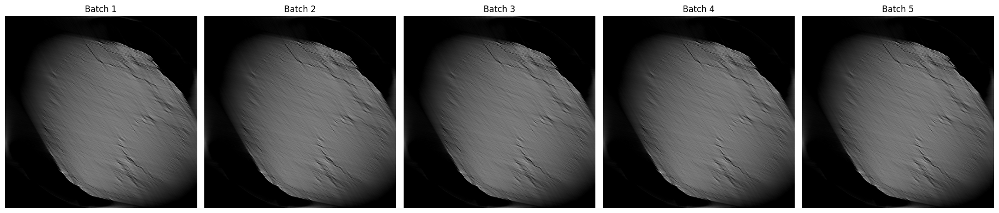

In [44]:
# Build the guidance lambda expected by GuidedDDIMScheduler
guidance_test = lambda x, t: sinogram_guidance_2d(
    projs_vrc=meas_projs.repeat(1, x.shape[0], 1),
    angles_deg=meas_angles,
    vol_init=x.to(device),
    max_epochs=[10],
    lr=[0.001],
    batch_size=30,
    verbose=True,
)

recon_test = guidance_test(torch.zeros_like(gt_recon).repeat(5, 1, 1), t=900)  # test run to warm up
# plot all 5 images in the batch
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i in range(5):
    axes[i].imshow(recon_test[i].cpu(), cmap='gray')
    axes[i].set_title(f"Batch {i+1}")
    axes[i].axis('off')
plt.tight_layout()

recon_test, normalize_fn(recon_test)

## 8. Run DDIM Pipeline with Guidance

In [45]:
# Guidance hyperparameters
GUIDANCE_EPOCHS = [1]
GUIDANCE_LR = [0.0001]
GUIDANCE_BATCH_SIZE = 30

# Build the guidance lambda expected by GuidedDDIMScheduler
guidance = lambda x, t: sinogram_guidance_2d(
    projs_vrc=meas_projs.repeat(1, x.shape[0], 1),
    angles_deg=meas_angles,
    vol_init=x.to(device),  # warm start for early steps
    max_epochs=GUIDANCE_EPOCHS,
    lr=GUIDANCE_LR,
    batch_size=GUIDANCE_BATCH_SIZE,
)

print(f"Guidance ready: {K_ANGLES} angles, "
      f"{GUIDANCE_EPOCHS} GD epochs/step, lr={GUIDANCE_LR}")

Guidance ready: 400 angles, [1] GD epochs/step, lr=[0.0001]


In [54]:
torch.cuda.empty_cache()
NUM_INFERENCE_STEPS = 50

model.config.sample_size = gt_recon.shape[0]  # (H, W)

noise_scheduler = GuidedDDIMScheduler(
    num_train_timesteps=1000,
    guidance_function=guidance,
    # clip_sample=True,  # model was trained on raw FBP values, not [-1,1]
)

pipeline = DDIMPipeline(
    unet=model.to(device),
    scheduler=noise_scheduler,
    fdk_prior=None,           # unconditional
    normalize_fn=normalize_fn,   # raw → normalized (×norm_scale)
    denormalize_fn=denormalize_fn, # normalized → raw (÷norm_scale)
    slice_batch_size=2,       # single 2D slice
)

t0 = time.time()
result = pipeline(
    batch_size=2,             # single slice: image shape = (1, H, W)
    num_inference_steps=NUM_INFERENCE_STEPS,
    eta=0.0,                  # deterministic DDIM
)
diffusion_recon = result.images.squeeze(0).cpu()  # (H, W)
dt = time.time() - t0

print(f"Guided DDIM reconstruction done in {dt:.1f}s")
print(f"  shape: {diffusion_recon.shape}")
print(f"  range: [{diffusion_recon.min():.4f}, {diffusion_recon.max():.4f}]")

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [01:20<00:00,  1.61s/it]

Guided DDIM reconstruction done in 80.7s
  shape: torch.Size([10, 640, 640])
  range: [0.0000, 0.0034]


## 9. Compare and Compute Metrics

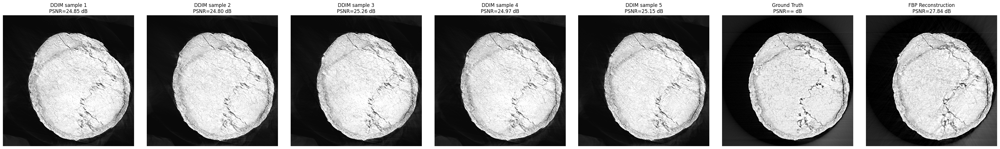

diffusion_recon shape: torch.Size([10, 640, 640])  |  range: [0.0000, 0.0034]


In [55]:
# diffusion_recon is (N, H, W) — show samples with PSNR vs ground truth
n_samples = diffusion_recon.shape[0]
gt_np = gt_recon.cpu().numpy()
fbp_np = sw_fbp_recon.cpu().numpy()

data_range = gt_np.max() - gt_np.min()
show_samples = min(5, n_samples)
show_n = show_samples + 2  # DDIM samples + GT + FBP

psnr_samples = [
    compute_psnr(gt_np, diffusion_recon[i].numpy(), data_range=data_range)
    for i in range(show_samples)
]
psnr_fbp = compute_psnr(gt_np, fbp_np, data_range=data_range)

fig, axes = plt.subplots(1, show_n, figsize=(show_n * 5, 5))
if show_n == 1:
    axes = [axes]

for i in range(show_samples):
    axes[i].imshow(diffusion_recon[i].numpy(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[i].set_title(f"DDIM sample {i + 1}\nPSNR={psnr_samples[i]:.2f} dB")
    axes[i].axis('off')

axes[show_samples].imshow(gt_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[show_samples].set_title("Ground Truth\nPSNR=∞ dB")
axes[show_samples].axis('off')

axes[show_samples + 1].imshow(fbp_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[show_samples + 1].set_title(f"FBP Reconstruction\nPSNR={psnr_fbp:.2f} dB")
axes[show_samples + 1].axis('off')

plt.tight_layout()
plt.show()

print(f"diffusion_recon shape: {diffusion_recon.shape}  |  "
      f"range: [{diffusion_recon.min():.4f}, {diffusion_recon.max():.4f}]")

In [56]:
gt_np = gt_recon.cpu().numpy()
la_fbp_np = la_fbp.cpu().numpy()
diff_np = diffusion_recon.numpy()  # (N, H, W)

data_range = gt_np.max() - gt_np.min()

# Limited-angle FBP baseline
psnr_la = compute_psnr(gt_np, la_fbp_np, data_range=data_range)
ssim_la = compute_ssim(gt_np, la_fbp_np, data_range=data_range)

# Per-sample metrics for the DDIM batch, then average
psnr_ddim_list = [compute_psnr(gt_np, diff_np[i], data_range=data_range) for i in range(diff_np.shape[0])]
ssim_ddim_list = [compute_ssim(gt_np, diff_np[i], data_range=data_range) for i in range(diff_np.shape[0])]
psnr_ddim = float(np.mean(psnr_ddim_list))
ssim_ddim = float(np.mean(ssim_ddim_list))

# Mean reconstruction
mean_recon_np = diff_np.mean(axis=0)  # (H, W)
psnr_mean = compute_psnr(gt_np, mean_recon_np, data_range=data_range)
ssim_mean = compute_ssim(gt_np, mean_recon_np, data_range=data_range)

print(f"{'Method':<35} {'PSNR (dB)':>10} {'SSIM':>8}")
print("-" * 55)
print(f"{'Limited-angle FBP':<35} {psnr_la:>10.2f} {ssim_la:>8.4f}")
print(f"{'Guided DDIM (mean of metrics)':<35} {psnr_ddim:>10.2f} {ssim_ddim:>8.4f}")
print(f"{'Guided DDIM (mean reconstruction)':<35} {psnr_mean:>10.2f} {ssim_mean:>8.4f}")
print(f"\nPer-sample PSNR: {[f'{v:.2f}' for v in psnr_ddim_list]}")
print(f"Per-sample SSIM: {[f'{v:.4f}' for v in ssim_ddim_list]}")


Method                               PSNR (dB)     SSIM
-------------------------------------------------------
Limited-angle FBP                        10.70   0.2354
Guided DDIM (mean of metrics)            24.60   0.3998
Guided DDIM (mean reconstruction)        25.24   0.4257

Per-sample PSNR: ['24.85', '24.80', '25.26', '24.97', '25.15', '23.61', '24.59', '24.08', '24.38', '24.30']
Per-sample SSIM: ['0.4000', '0.3917', '0.4058', '0.4013', '0.4109', '0.3763', '0.4265', '0.3799', '0.3985', '0.4073']


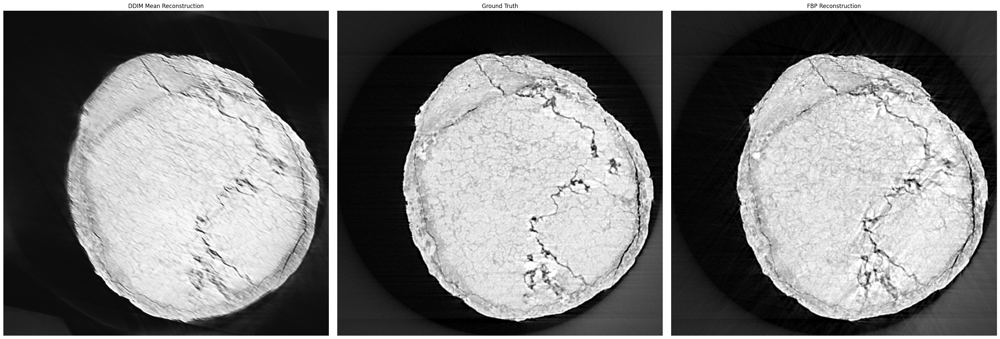

diffusion_recon shape: torch.Size([10, 640, 640])  |  range: [0.0000, 0.0034]


In [61]:
# diffusion_recon is (N, H, W) — show two samples for a quick sanity check
n_samples = diffusion_recon.shape[0]
show_n = min(3, n_samples+1)
vmin, vmax = np.percentile(gt_np, [1, 99])

fig, axes = plt.subplots(1, show_n, figsize=(show_n * 10, 10))
axes[0].imshow(mean_recon_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title(f"DDIM Mean Reconstruction")
axes[0].axis('off')

axes[1].imshow(gt_recon.cpu().numpy(), cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title(f"Ground Truth")
axes[1].axis('off')

axes[2].imshow(sw_fbp_recon.cpu().numpy(), cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title(f"FBP Reconstruction")
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"diffusion_recon shape: {diffusion_recon.shape}  |  "
      f"range: [{diffusion_recon.min():.4f}, {diffusion_recon.max():.4f}]")


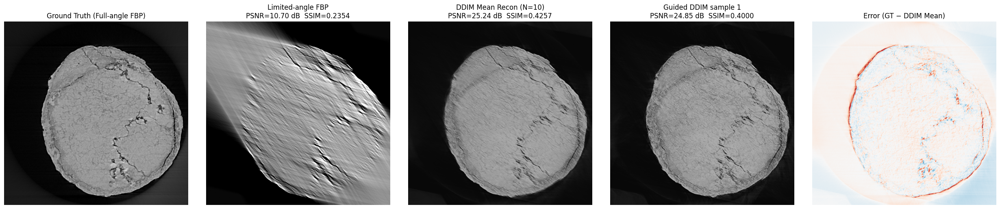

In [58]:
vmin, vmax = np.percentile(gt_np, [1, 100])

# Show GT, LA-FBP, mean reconstruction, N DDIM samples, and error map of mean
show_samples = min(1, diff_np.shape[0])
ncols = 4 + show_samples  # GT + LA-FBP + mean recon + N samples + error map of mean

fig, axes = plt.subplots(1, ncols, figsize=(ncols * 5, 5))

axes[0].imshow(gt_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title('Ground Truth (Full-angle FBP)')
axes[0].axis('off')

axes[1].imshow(la_fbp_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title(f'Limited-angle FBP\nPSNR={psnr_la:.2f} dB  SSIM={ssim_la:.4f}')
axes[1].axis('off')

axes[2].imshow(mean_recon_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title(f'DDIM Mean Recon (N={diff_np.shape[0]})\nPSNR={psnr_mean:.2f} dB  SSIM={ssim_mean:.4f}')
axes[2].axis('off')

for k in range(show_samples):
    axes[3 + k].imshow(diff_np[k], cmap='gray', vmin=vmin, vmax=vmax)
    axes[3 + k].set_title(
        f'Guided DDIM sample {k + 1}\n'
        f'PSNR={psnr_ddim_list[k]:.2f} dB  SSIM={ssim_ddim_list[k]:.4f}'
    )
    axes[3 + k].axis('off')

# Error map for the mean reconstruction
diff_err = gt_np - mean_recon_np
err_range = max(abs(diff_err.min()), abs(diff_err.max()))
axes[-1].imshow(diff_err, cmap='RdBu', vmin=-err_range, vmax=err_range)
axes[-1].set_title('Error (GT − DDIM Mean)')
axes[-1].axis('off')

plt.tight_layout()
plt.show()


## 10. Optional: Fine-tune with Extra GD Iterations

Run additional gradient-descent iterations on the diffusion output to further
improve data consistency with the measured projections.

In [25]:
# Fine-tune each sample in the batch
recon_finetuned_list = []
for i in range(diff_np.shape[0]):
    ft = gd_reconstruction_masked(
        projs_vrc=meas_projs,
        angles_deg=meas_angles,
        lamino_angle_deg=LAMINO_ANGLE_DEG,
        vol_shape=vol_shape_2d,
        det_spacing_mm=DET_SPACING_MM,
        vol_init=diffusion_recon[i].unsqueeze(0).to(device),  # (1, H, W)
        max_epochs=10,
        lr=0.0001,
        batch_size=200,
        clamp_min=0.0,
        device=device,
        verbose=(i == 0),  # only verbose for first sample
    ).squeeze(0).cpu()  # (H, W)
    recon_finetuned_list.append(ft)

recon_ft_np = np.stack([r.numpy() for r in recon_finetuned_list])  # (N, H, W)

psnr_ft_list = [compute_psnr(gt_np, recon_ft_np[i], data_range=data_range) for i in range(recon_ft_np.shape[0])]
ssim_ft_list = [compute_ssim(gt_np, recon_ft_np[i], data_range=data_range) for i in range(recon_ft_np.shape[0])]
psnr_ft = float(np.mean(psnr_ft_list))
ssim_ft = float(np.mean(ssim_ft_list))

print(f"\n{'Method':<30} {'PSNR (dB)':>10} {'SSIM':>8}")
print("-" * 50)
print(f"{'Limited-angle FBP':<30} {psnr_la:>10.2f} {ssim_la:>8.4f}")
print(f"{'Guided DDIM (mean, N={})'.format(diff_np.shape[0]):<30} {psnr_ddim:>10.2f} {ssim_ddim:>8.4f}")
print(f"{'DDIM + GD fine-tune (mean)':<30} {psnr_ft:>10.2f} {ssim_ft:>8.4f}")
print(f"\nPer-sample PSNR (GD): {[f'{v:.2f}' for v in psnr_ft_list]}")
print(f"Per-sample SSIM (GD): {[f'{v:.4f}' for v in ssim_ft_list]}")


 20%|██        | 2/10 [00:00<00:00, 12.97it/s, loss=9.487e-04, avg=9.487e-04, k=200, lr=1.0e-04, opt=ADAM]

[0.0001] [10]


100%|██████████| 10/10 [00:00<00:00, 13.71it/s, loss=1.586e-04, avg=1.739e-04, k=200, lr=1.0e-04, opt=ADAM]



Method                          PSNR (dB)     SSIM
--------------------------------------------------
Limited-angle FBP                   10.70   0.2354
Guided DDIM (mean, N=100)           24.64   0.4187
DDIM + GD fine-tune (mean)          24.50   0.3643

Per-sample PSNR (GD): ['24.51', '24.03', '24.44', '23.97', '23.93', '25.65', '24.56', '23.69', '24.18', '24.56', '25.08', '23.94', '24.91', '25.09', '24.73', '24.13', '24.11', '23.70', '24.96', '24.81', '24.60', '23.89', '23.93', '24.27', '24.10', '24.20', '24.30', '23.65', '23.93', '24.99', '24.88', '24.28', '25.42', '25.09', '24.99', '23.99', '24.65', '25.17', '24.27', '24.37', '24.87', '24.75', '24.07', '24.74', '25.15', '24.83', '25.44', '24.22', '25.30', '25.05', '24.28', '25.13', '24.19', '25.07', '23.61', '24.71', '24.35', '23.87', '24.94', '24.47', '23.50', '24.99', '24.77', '24.89', '24.46', '23.87', '25.07', '24.64', '24.19', '25.42', '25.01', '24.74', '24.18', '24.16', '23.97', '23.88', '24.38', '24.36', '24.78', '24.46', 

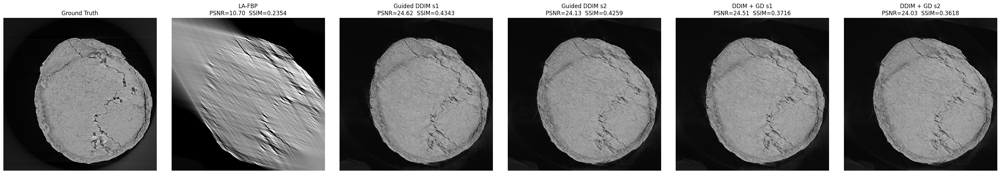

In [26]:
show_samples = min(2, diff_np.shape[0])
ncols = 2 + show_samples * 2  # GT + LA-FBP + N DDIM + N GD

fig, axes = plt.subplots(1, ncols, figsize=(ncols * 5, 5))

axes[0].imshow(gt_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title('Ground Truth')
axes[0].axis('off')

axes[1].imshow(la_fbp_np, cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title(f'LA-FBP\nPSNR={psnr_la:.2f}  SSIM={ssim_la:.4f}')
axes[1].axis('off')

for k in range(show_samples):
    axes[2 + k].imshow(diff_np[k], cmap='gray', vmin=vmin, vmax=vmax)
    axes[2 + k].set_title(
        f'Guided DDIM s{k + 1}\nPSNR={psnr_ddim_list[k]:.2f}  SSIM={ssim_ddim_list[k]:.4f}'
    )
    axes[2 + k].axis('off')

for k in range(show_samples):
    axes[2 + show_samples + k].imshow(recon_ft_np[k], cmap='gray', vmin=vmin, vmax=vmax)
    axes[2 + show_samples + k].set_title(
        f'DDIM + GD s{k + 1}\nPSNR={psnr_ft_list[k]:.2f}  SSIM={ssim_ft_list[k]:.4f}'
    )
    axes[2 + show_samples + k].axis('off')

plt.tight_layout()
plt.show()


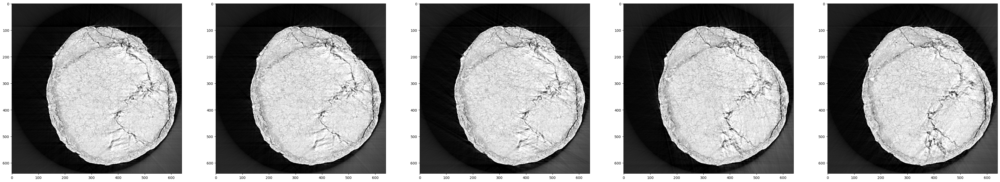

In [62]:

vmin, vmax = np.percentile(gt_recon.cpu().numpy(), [1, 99])
ncols = 5
fig, axes = plt.subplots(1, ncols, figsize=(ncols * 10, 10))
for i in range(ncols):
    slice_idx = max(0, 200 + i * K_ANGLES - 1501//2)
    axes[i].imshow(denormalize_fn(la_recons_dataset[slice_idx].cpu().squeeze()), cmap='gray', vmin=vmin, vmax=vmax)
